In [1]:
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import numpy as np
from scipy import stats
from itertools import combinations
from pathlib import Path
from pipeline.general_utils.read_xml import extract_tracking_info
from pipeline.general_utils.plot_utils import plot_AT, plot_hist, plot_violin, run_statistical_tests, plot_violin_time_windows, plot_violin_filter_modes

In [2]:
# increase the font sizes to make plots more readable
plt.rcParams.update({
    "font.size": 14,
    "axes.titlesize": 14,
    "axes.labelsize": 14,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 12,
})

# plots for PLC/PRF/5 cells

In [3]:
###
# FILL IN THE USER OPTIONS BELOW
###

data_path = Path.cwd() / "data_PLC_PRF"  # specify the path to the folder with the data

num_of_frames = 288  # the number of frames acquired

dt = 5  # the time between two frames in the movie in minutes  (sampling time)

###
# END OF USER OPTIONS
###

In [4]:
###
# FILL IN THE USER OPTIONS BELOW
###

# identifier tag of one experimental (replicates with same treatment) condition based on how the folder is named inside the data folder
experiment_tag = "control"

###
# END OF USER OPTIONS
###

experiment_paths = list(data_path.glob(f"{experiment_tag}/*/Pos*/results/registered/*"))
control_TL_PLC, control_AT_PLC, control_dict_PLC =  extract_tracking_info(experiment_paths, num_of_frames, dt) 

found 6979 tracks in 251 nuclei across 8 fields of view
avg active tracks per cell: 3.1896581147960634
avg track length in minutes: 80.3424559392463


In [5]:
###
# FILL IN THE USER OPTIONS BELOW
###

# identifier tag of one experimental (replicates with same treatment) condition based on how the folder is named inside the data folder
experiment_tag = "Xray_1_5_Gy"

###
# END OF USER OPTIONS
###

experiment_paths = list(data_path.glob(f"{experiment_tag}/*/Pos*/results/registered/*"))
ebrt15_TL, ebrt15_AT, ebrt15_dict =  extract_tracking_info(experiment_paths, num_of_frames, dt)     

found 13221 tracks in 215 nuclei across 8 fields of view
avg active tracks per cell: 8.79805615550756
avg track length in minutes: 110.91899251191286


In [6]:
###
# FILL IN THE USER OPTIONS BELOW
###

# identifier tag of one experimental (replicates with same treatment) condition based on how the folder is named inside the data folder
experiment_tag = "Xray_2_5_Gy"

###
# END OF USER OPTIONS
###

experiment_paths = list(data_path.glob(f"{experiment_tag}/*/Pos*/results/registered/*"))
ebrt25_TL, ebrt25_AT, ebrt25_dict =  extract_tracking_info(experiment_paths, num_of_frames, dt)     

found 20266 tracks in 214 nuclei across 8 fields of view
avg active tracks per cell: 12.743392039149857
avg track length in minutes: 110.50330602980361


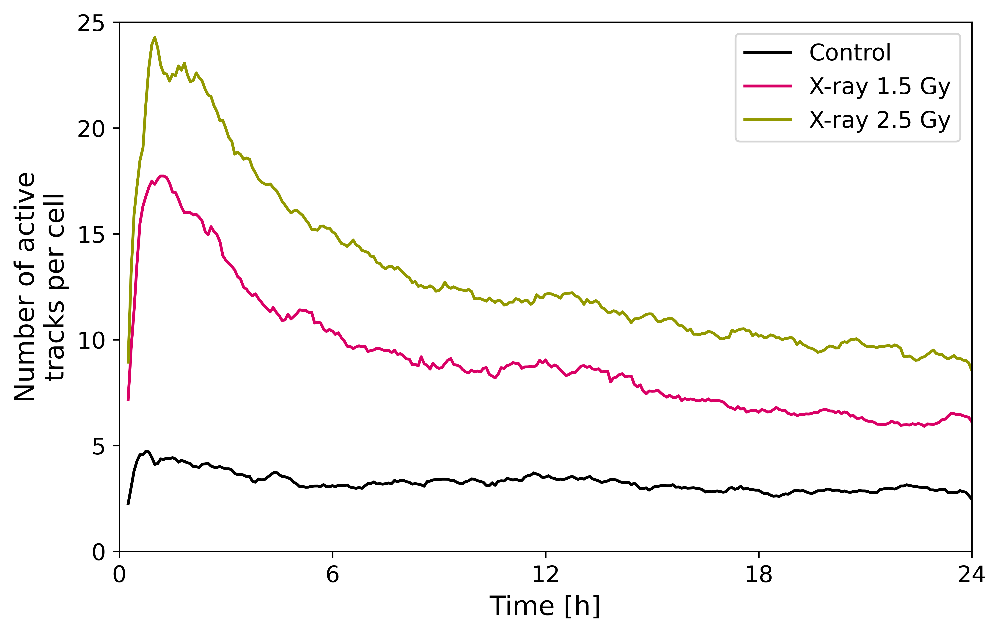

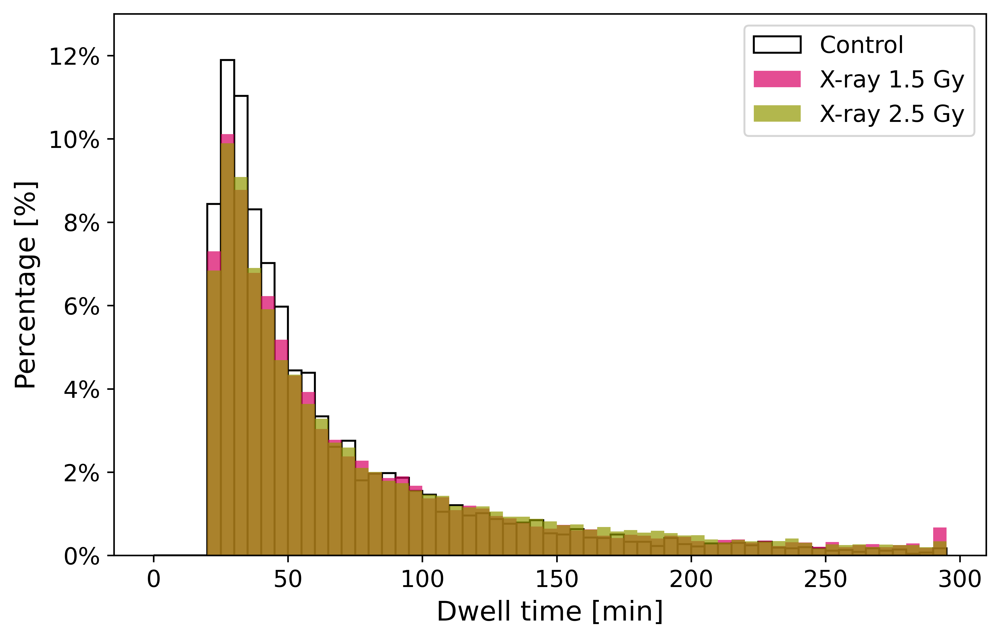

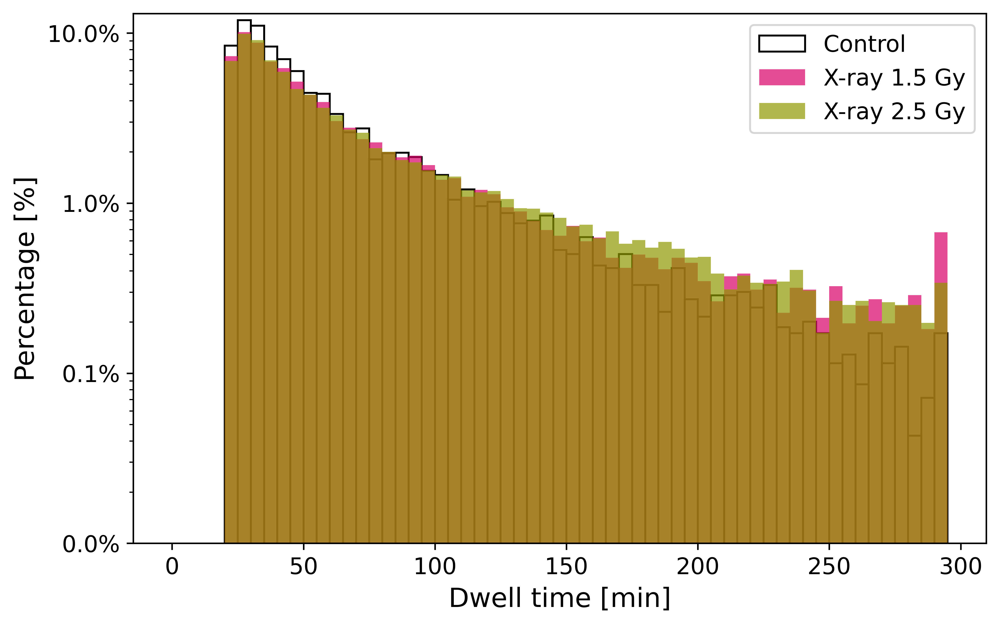

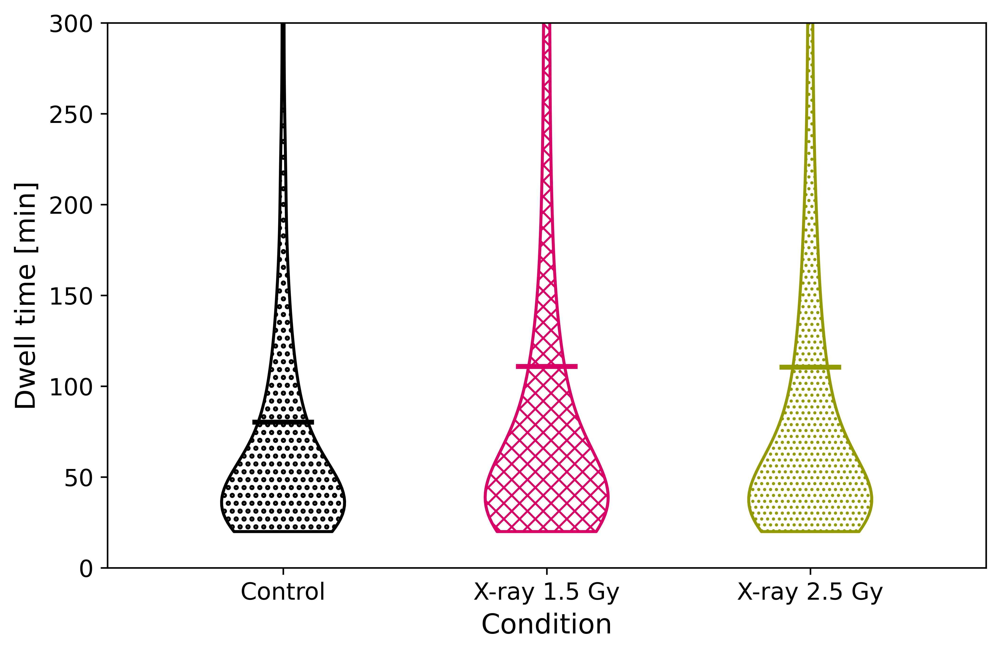

In [7]:
###
# FILL IN THE USER OPTIONS BELOW
###

plot_samples = [
    {
        "name": "Control",               # the name of the data, will be used in the legend of the plot
        "results_dict": control_dict_PLC,    # the dictionairy with the loaded xml file statistics
        "active_tracks": control_AT_PLC,     # the array with the number of active tracks
        "track_lengths": control_TL_PLC,     # the array with the length of the tracks
        "color": "black",                # the color used for plotting the active tracks
        "linestyle": "solid",            # line style for plotting the active tracks
        "alpha": 1.0,                    # the opacity for displaying the bars in a histogram
        "edgecolor": "black",            # color of the edge of the bars in the histogram, set to none to make it transparant
        "facecolor": "none",             # color of the bars in the histogram, set to none to make it transparant
        "hatch": 'ooo',                  # hatching pattern for the violin plots
    },
    {
        "name": "X-ray 1.5 Gy",
        "results_dict": ebrt15_dict,
        "active_tracks": ebrt15_AT,
        "track_lengths": ebrt15_TL,
        "color": "xkcd:dark hot pink",
        "linestyle": "solid",
        "alpha": 0.7,
        "edgecolor": "none",
        "facecolor": "xkcd:dark hot pink",
        "hatch": 'xxx',
    },
    {
        "name": "X-ray 2.5 Gy",
        "results_dict": ebrt25_dict,
        "active_tracks": ebrt25_AT,
        "track_lengths": ebrt25_TL,
        "color": "xkcd:pea soup",
        "linestyle": "solid",
        "alpha": 0.7,
        "edgecolor": "none",
        "facecolor": "xkcd:pea soup",
        "hatch": '....',
    },
]

    
time_offset = 15  # add time offset in minutes to plots for setting up the microscope. set to 0 to not use it

# how many of the last frames to remove, this is because the min_track_length for the tracking causes the number of active
# tracks to drop at the end because there are no more frames to start new tracks that are longer than the min length
remove_final_frames = 4

foci_max = 25 # maximum to display on the y-axis of the plot for the number of active tracks

max_bin = 300  # upper limit in minutes for the bins in the histogram of the dwell times

percent_max = 13  # maximum percentage to display for the y axis of the histogram                    

###
# END OF USER OPTIONS
###


#  MAKE PLOT OF ACTIVATE TRACKS
shifted_time = np.arange(num_of_frames) * dt/60 + time_offset/60  
plt.figure(figsize=(8,5), dpi=600)
plot_AT(shifted_time, plot_samples)
plt.xlim([0, num_of_frames * dt / 60])  # fix the x limits if needed
plt.xticks(np.arange(0, shifted_time.max(), 6))  # define the tick marks for the x axis
plt.ylim([0,foci_max])  # fix the y limits if needed
#plt.savefig(str(data_path / "active_tracks_C_vs_Xray_PLCPRF.png"), dpi=600, bbox_inches="tight")  # for saving the figure

#  MAKE PLOT OF TRACK LENGTHS
bins = np.arange(0, max_bin, dt)

# linear y-axis plot
plt.figure(figsize=(8,5), dpi=600)
plot_hist(bins, plot_samples, log=False)
plt.ylim(0, percent_max/100)
#plt.savefig(str(data_path / "hist_tl_C_vs_Xra_PLCPRFy.png"), dpi=600, bbox_inches="tight")  # for saving the figure

# log y-axis plot
plt.figure(figsize=(8,5), dpi=600)
plot_hist(bins, plot_samples, log=True)
plt.ylim(1e-4, percent_max/100)
#plt.savefig(str(data_path / "hist_tl_C_vs_Xray_log_PLCPRF.png"), dpi=600, bbox_inches="tight")  # for saving the figure

plt.figure(figsize=(8,5), dpi=600)
plot_violin(plot_samples, max_bin)
#plt.savefig(str(data_path / "violin_C_vs_Xray_PLCPRF.png"), dpi=600, bbox_inches="tight")  # for saving the figure

### make a plot with dwell time for different subwindows

Text(0.5, 1.0, 'Track duration distributions over time')

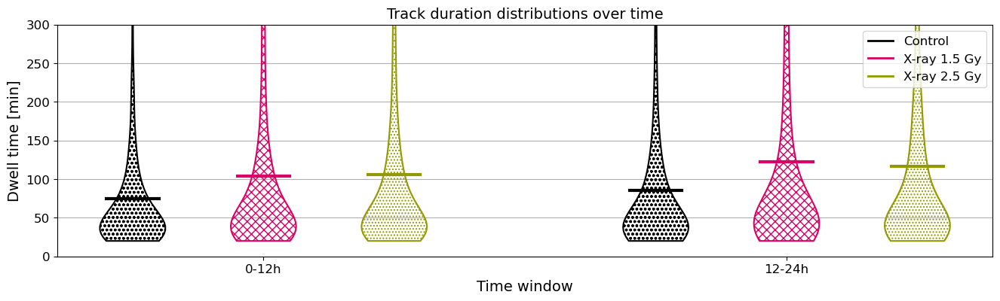

In [8]:
###
# FILL IN THE USER OPTIONS BELOW
###

time_windows = [
    (0, 12*60, "0-12h"),   # define the blocks for which you would like to plot the dwell time separatly
    (12*60, 24*60, "12-24h")
]

###
# END OF USER OPTIONS
###

fig, ax = plt.subplots(figsize=(16,4))
ax.grid(axis='y')
ax.set_axisbelow(True)
plot_violin_time_windows(time_windows, max_bin, plot_samples, ax=ax, mode="max_overlap")
plt.title("Track duration distributions over time")

#plt.savefig(str(data_path / "PLC_PRF_windowed_dwelltime.png"), dpi=600, bbox_inches="tight")  # for saving the figure

### make plot of the replicates to see consistency

making plot for: control
found 3202 tracks in 143 nuclei across 4 fields of view
avg active tracks per cell: 2.4077272500374383
avg track length in minutes: 75.31855090568395
found 3777 tracks in 108 nuclei across 4 fields of view
avg active tracks per cell: 4.225322314049587
avg track length in minutes: 84.6015356102727
making plot for: Xray_1_5_Gy
found 7171 tracks in 123 nuclei across 4 fields of view
avg active tracks per cell: 7.642209707696433
avg track length in minutes: 99.35085762097337
found 6050 tracks in 92 nuclei across 4 fields of view
avg active tracks per cell: 10.264992172078143
avg track length in minutes: 124.6305785123967
making plot for: Xray_2_5_Gy
found 7212 tracks in 112 nuclei across 4 fields of view
avg active tracks per cell: 10.628222881635345
avg track length in minutes: 111.7422351636162
found 13054 tracks in 102 nuclei across 4 fields of view
avg active tracks per cell: 14.348663797417675
avg track length in minutes: 109.81882947755477


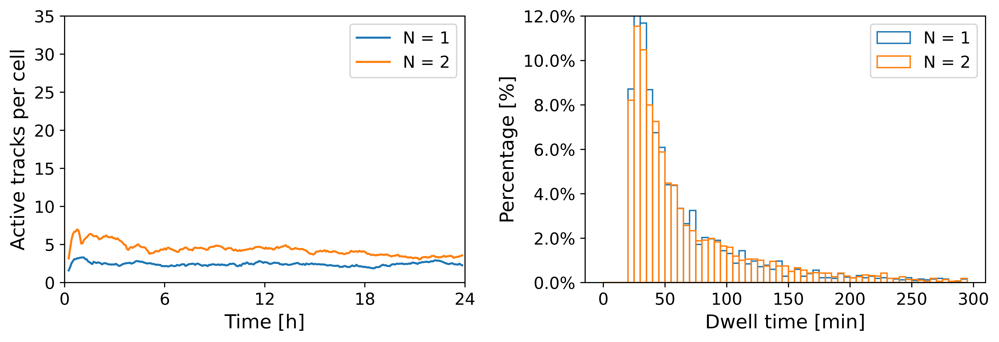

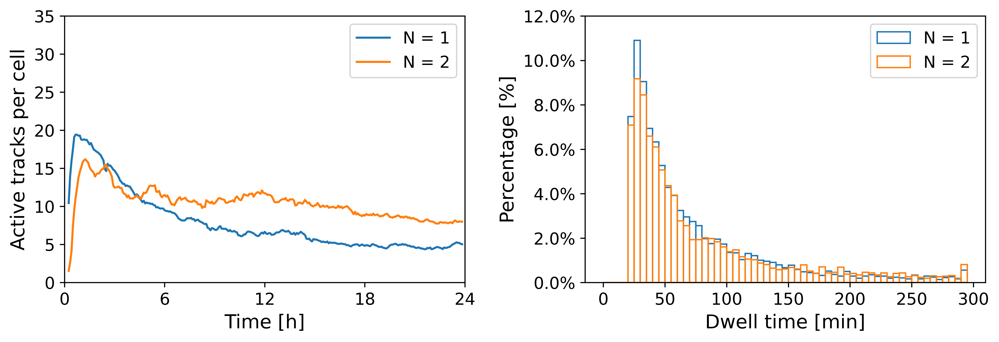

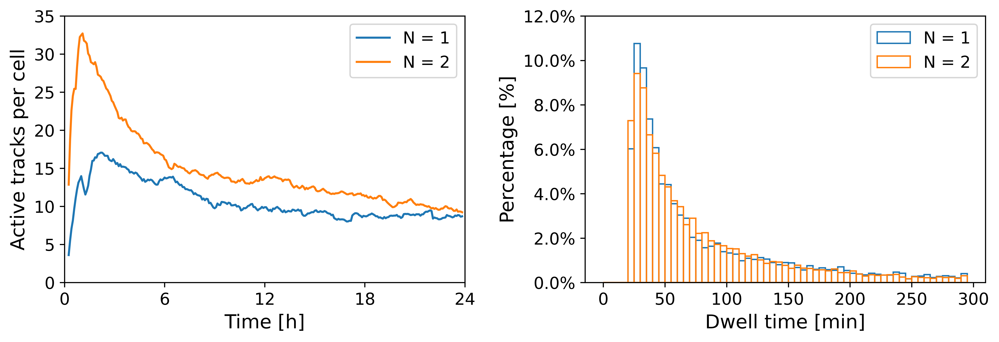

In [13]:
###
# FILL IN THE USER OPTIONS BELOW
###

# identifier tag of one experimental (replicates with same treatment) condition based on how the folder inside the data folder
experiment_tags = ["control", "Xray_1_5_Gy", "Xray_2_5_Gy"]

foci_max = 35 # maximum to display on the y-axis of the plot for the number of active tracks

percent_max = 12  # maximum percentage to display for the y axis of the histogram

###
# END OF USER OPTIONS
###

for experiment_tag in experiment_tags:
    print(f"making plot for: {experiment_tag}")
    
    replicates = list(data_path.glob(f"{experiment_tag}/*/"))
    
    fig, ax = plt.subplots(1, 2, figsize=(12,3.5), dpi=600)
    for nn, replicate_path in enumerate(replicates):
        exp_path = list(replicate_path.glob("Pos*/results/registered/*"))
    
        TL, AT, _ =  extract_tracking_info(exp_path, num_of_frames, dt)  

        line, = ax[0].plot(shifted_time[:-remove_final_frames], np.nanmean(AT, 0)[:-remove_final_frames], label=f"N = {nn+1}")
        color = line.get_color()
        
        weights = np.ones_like(TL, dtype=float) / len(TL)
        ax[1].hist(TL, bins=bins, weights=weights, label=f"N = {nn+1}", facecolor="none", edgecolor=color)
        
    ax[0].set_ylabel('Active tracks per cell')
    ax[0].set_ylim([0, foci_max])
    ax[0].set_xlabel('Time [h]')
    ax[0].set_xlim([0, num_of_frames * dt / 60])
    ax[0].set_xticks(np.arange(0, shifted_time.max(), 6))
    ax[0].legend(loc='upper right')
    
    ax[1].set_ylabel("Percentage [%]")
    ax[1].set_ylim([0, percent_max/100])
    ax[1].set_xlabel("Dwell time [min]")
    ax[1].yaxis.set_major_formatter(PercentFormatter(1))
    ax[1].legend(loc='upper right')

    fig.subplots_adjust(wspace=0.3)
    #plt.savefig(str(data_path / f"replicates_{experiment_tag}.png"), dpi=600, bbox_inches="tight")  # for saving the figure

### make a plot of the different track filtering modes

found 6979 tracks in 251 nuclei across 8 fields of view
avg active tracks per cell: 3.1896581147960634
avg track length in minutes: 80.3424559392463
found 13221 tracks in 215 nuclei across 8 fields of view
avg active tracks per cell: 8.79805615550756
avg track length in minutes: 110.91899251191286
found 20266 tracks in 214 nuclei across 8 fields of view
avg active tracks per cell: 12.743392039149857
avg track length in minutes: 110.50330602980361
found 6979 tracks in 251 nuclei across 8 fields of view
avg active tracks per cell: 3.1896581147960634
avg track length in minutes: 69.4612172795889
found 13221 tracks in 215 nuclei across 8 fields of view
avg active tracks per cell: 8.79805615550756
avg track length in minutes: 94.06135735307232
found 20266 tracks in 214 nuclei across 8 fields of view
avg active tracks per cell: 12.743392039149857
avg track length in minutes: 95.57994279376568


Text(0.5, 1.0, 'Effect of track filtering within each treatment')

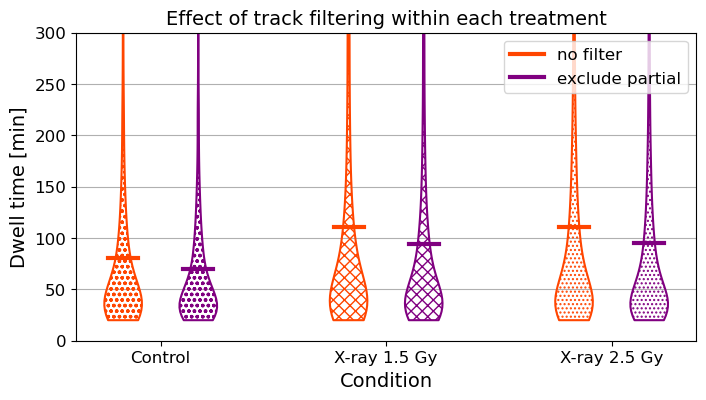

In [8]:
###
# FILL IN THE USER OPTIONS BELOW
###

filter_modes = ["no filter", "exclude partial"]
filter_mode_colors = {
    "no filter": "orangered",              
    "exclude partial": "purple"   
}

filter_plot_samples = [
    {
        "name": "Control",    # name for displaying in the legend of the plots
        "tag": "control",     # identifier tag of one experimental (replicates with same treatment) condition based on how the folder inside the data folder
        "hatch": "ooo",       # hatching pattern for the violin plots
    },
    {
        "name": "X-ray 1.5 Gy",
        "tag": "Xray_1_5_Gy",
        "hatch": "xxx",
    },
    {
        "name": "X-ray 2.5 Gy",
        "tag": "Xray_2_5_Gy",
        "hatch": "....",
    },
]


###
# END OF USER OPTIONS
###


filter_results = {}
for mode in filter_modes:
    samples_for_mode = []
    for sample in filter_plot_samples:

        experiment_paths = list(data_path.glob(f"{sample['tag']}/*/Pos*/results/registered/*"))

        TL, AT, results_dict = extract_tracking_info(experiment_paths, num_of_frames, dt, track_filter=mode)

        samples_for_mode.append({"name": sample["name"], "track_lengths": TL, "hatch": sample["hatch"], })

    filter_results[mode] = samples_for_mode

grouped_filters = [(mode, filter_results[mode]) for mode in filter_modes]

fig, ax = plt.subplots(figsize=(8,4))
ax.grid(axis='y')
ax.set_axisbelow(True)
plot_violin_filter_modes(filter_results, filter_plot_samples, filter_modes, filter_mode_colors, max_bin, ax=ax)
plt.title("Effect of track filtering within each treatment")

#plt.savefig(str(data_path / "track_filter_PLCPRF.png"), dpi=600, bbox_inches="tight")  # for saving the figure

### make a panel with different plots to not have to combine them manually

In [9]:
fig, ax = plt.subplots(4, 1, figsize=(8,16), dpi=1000)

shifted_time = np.arange(num_of_frames) * dt/60 + time_offset/60  
plot_AT(shifted_time, plot_samples, ax=ax[0])
ax[0].set_xlim([0, num_of_frames * dt / 60])  # fix the x limits if needed
ax[0].set_xticks(np.arange(0, shifted_time.max(), 6))  # define the tick marks for the x axis
ax[0].set_ylim([0,foci_max])  # fix the y limits if needed

bins = np.arange(0, max_bin, dt)
plot_hist(bins, plot_samples, log=False, ax=ax[1])
ax[1].set_ylim(0, percent_max/100)

plot_violin(plot_samples, max_bin, ax=ax[2])

ax[3].grid(axis='y')
ax[3].set_axisbelow(True)
plot_violin_filter_modes(filter_results, filter_plot_samples, filter_modes, filter_mode_colors, max_bin, ax=ax[3])

fig.subplots_adjust(hspace=0.3)

plt.savefig(str(data_path / "PLC_PRF_panel.png"), dpi=600, bbox_inches="tight")  # for saving the figure

### perform statistical testing

In [22]:
result_string = run_statistical_tests(plot_samples)
print(result_string)

────────────────────────────────────────────────────────────
  Control  vs  Xray 1.5 Gy
  Number of tracks:   6979  vs  13221
  Mean dwell time:   80.3 min  vs  110.9 min
  Mean difference: +30.6 min
  Permutation test p-value:  0.0003999
  Bootstrap 95 % CI:         [26.86, 34.27] min
  Mann-Whitney U: 51668364,  p-value: 6.104e-45

────────────────────────────────────────────────────────────
  Control  vs  Xray 2.5 Gy
  Number of tracks:   6979  vs  20266
  Mean dwell time:   80.3 min  vs  110.5 min
  Mean difference: +30.2 min
  Permutation test p-value:  0.0003999
  Bootstrap 95 % CI:         [26.70, 33.46] min
  Mann-Whitney U: 80097908,  p-value: 9.713e-62

────────────────────────────────────────────────────────────
  Xray 1.5 Gy  vs  Xray 2.5 Gy
  Number of tracks:  13221  vs  20266
  Mean dwell time:  110.9 min  vs  110.5 min
  Mean difference: -0.4 min
  Permutation test p-value:  0.799
  Bootstrap 95 % CI:         [-3.64, 3.00] min
  Mann-Whitney U: 135498307,  p-value: 0.07

# Plot the data for the U2OS cells

In [10]:
###
# FILL IN THE USER OPTIONS BELOW
###

data_path = Path.cwd() / "data_U2OS"  # specify the path to the folder with the data

num_of_frames = 360  # the number of frames acquired

dt = 4  # the time between two frames in the movie in minutes  (sampling time)

###
# END OF USER OPTIONS
###

In [11]:
###
# FILL IN THE USER OPTIONS BELOW
###

# identifier tag of one experimental (replicates with same treatment) condition based on how the folder is named inside the data folder
experiment_tag = "control"

###
# END OF USER OPTIONS
###

experiment_paths = list(data_path.glob(f"{experiment_tag}/*/Pos*/results/registered/*"))
control_TL_U2OS, control_AT_U2OS, control_dict_U2OS =  extract_tracking_info(experiment_paths, num_of_frames, dt) 

found 34568 tracks in 460 nuclei across 12 fields of view
avg active tracks per cell: 7.074688170420121
avg track length in minutes: 75.93624161073825


In [12]:
###
# FILL IN THE USER OPTIONS BELOW
###

# identifier tag of one experimental (replicates with same treatment) condition based on how the folder is named inside the data folder
experiment_tag = "xray"

###
# END OF USER OPTIONS
###

experiment_paths = list(data_path.glob(f"{experiment_tag}/*/Pos*/results/registered/*"))
ebrt20_TL, ebrt20_AT, ebrt20_dict =  extract_tracking_info(experiment_paths, num_of_frames, dt) 

found 38987 tracks in 367 nuclei across 9 fields of view
avg active tracks per cell: 12.192170818505337
avg track length in minutes: 90.8489496498833


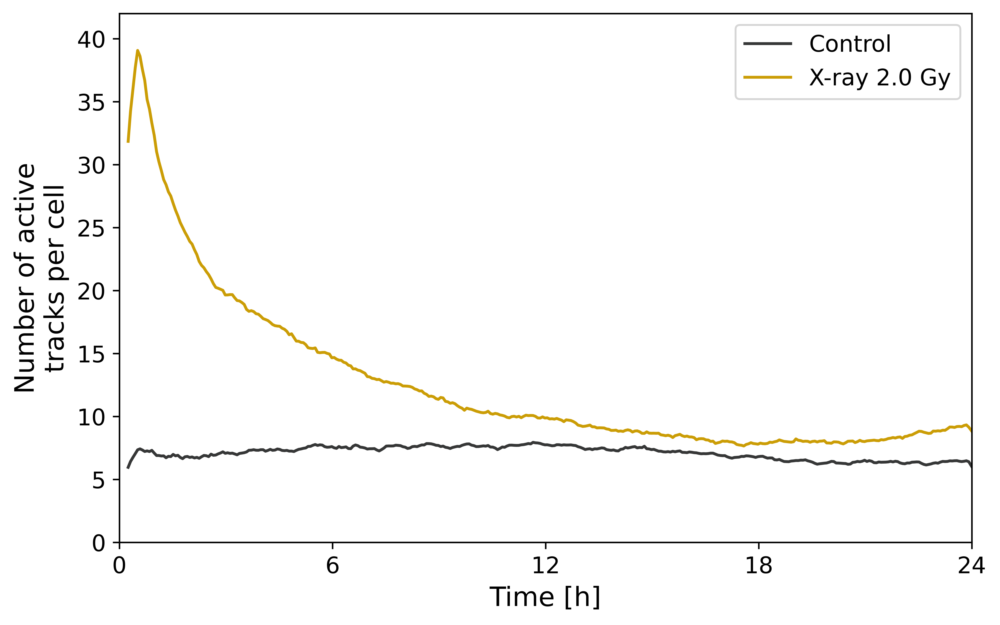

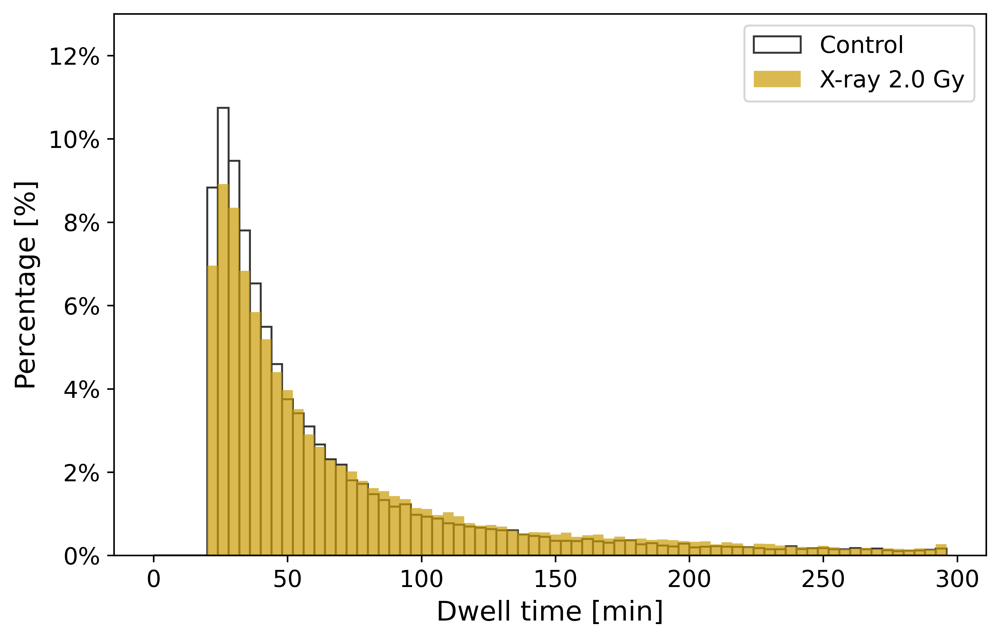

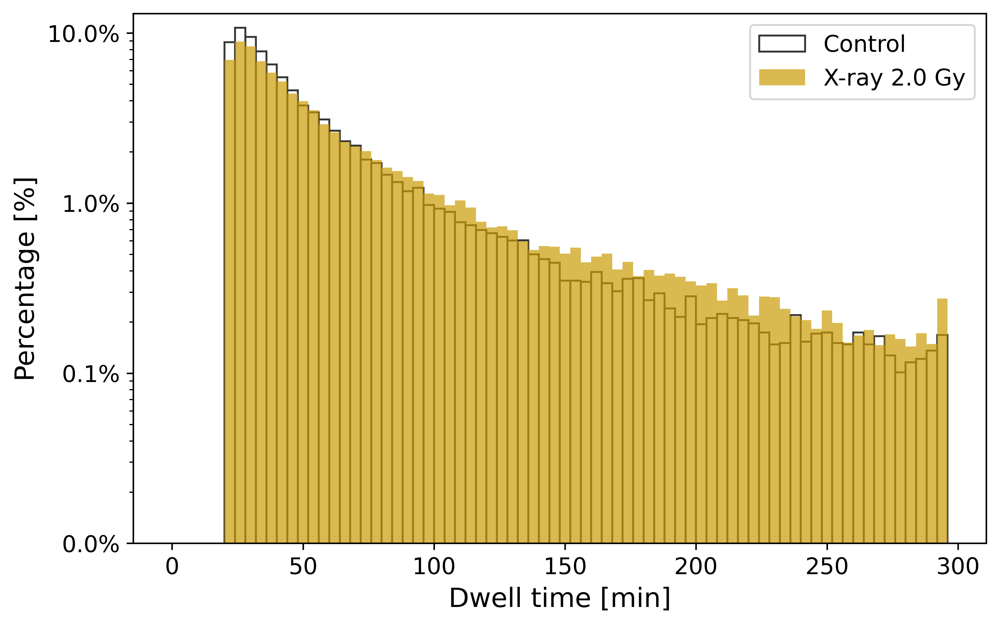

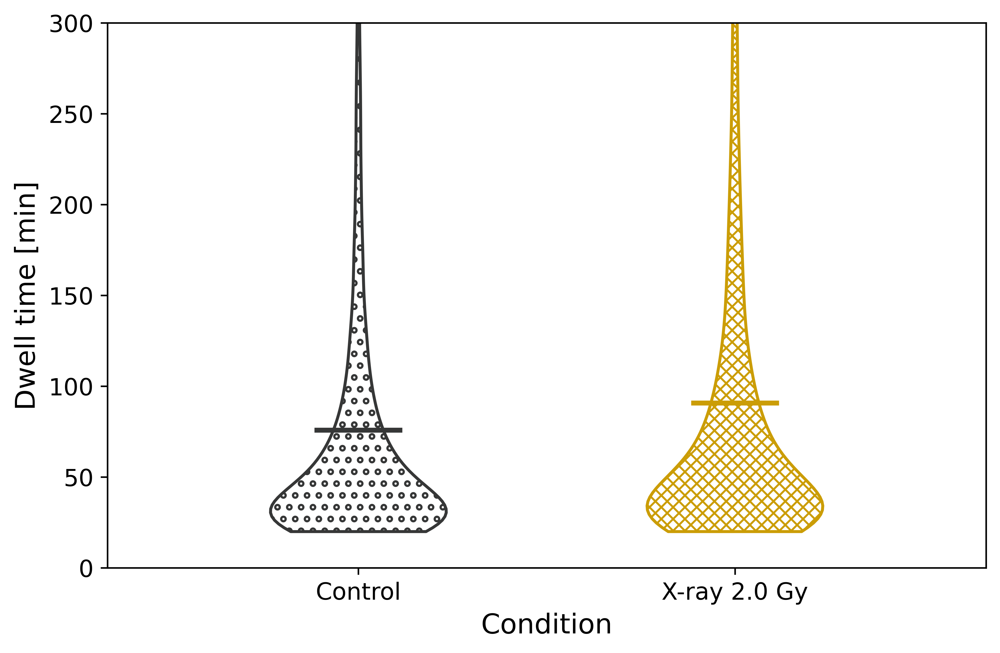

In [13]:
###
# FILL IN THE USER OPTIONS BELOW
###

plot_samples = [
    {
        "name": "Control",               # the name of the data, will be used in the legend of the plot
        "results_dict": control_dict_U2OS,    # the dictionairy with the loaded xml file statistics
        "active_tracks": control_AT_U2OS,     # the array with the number of active tracks
        "track_lengths": control_TL_U2OS,     # the array with the length of the tracks
        "color": "xkcd:dark grey",                # the color used for plotting the active tracks
        "linestyle": "solid",            # line style for plotting the active tracks
        "alpha": 1.0,                    # the opacity for displaying the bars in a histogram
        "edgecolor": "xkcd:dark grey",            # color of the edge of the bars in the histogram, set to none to make it transparant
        "facecolor": "none",             # color of the bars in the histogram, set to none to make it transparant
        "hatch": 'oo',                  # hatching pattern for the violin plots
    },
    {
        "name": "X-ray 2.0 Gy",
        "results_dict": ebrt20_dict,
        "active_tracks": ebrt20_AT,
        "track_lengths": ebrt20_TL,
        "color": "xkcd:yellow ochre",
        "linestyle": "solid",
        "alpha": 0.7,
        "edgecolor": "none",
        "facecolor": "xkcd:yellow ochre",
        "hatch": 'xxxx',
    },
]

    
time_offset = 15  # add time offset in minutes to plots for setting up the microscope. set to 0 to not use it

# how many of the last frames to remove, this is because the min_track_length for the tracking causes the number of active
# tracks to drop at the end because there are no more frames to start new tracks that are longer than the min length
remove_final_frames = 6

foci_max = 42 # maximum to display on the y-axis of the plot for the number of active tracks

max_bin = 300  # upper limit in minutes for the bins in the histogram of the dwell times

percent_max = 13  # maximum percentage to display for the y axis of the histogram                    

###
# END OF USER OPTIONS
###


#  MAKE PLOT OF ACTIVATE TRACKS
shifted_time = np.arange(num_of_frames) * dt/60 + time_offset/60  
plt.figure(figsize=(8,5), dpi=600)
plot_AT(shifted_time, plot_samples)
plt.xlim([0, num_of_frames * dt / 60])  # fix the x limits if needed
plt.xticks(np.arange(0, shifted_time.max(), 6))  # define the tick marks for the x axis
plt.ylim([0,foci_max])  # fix the y limits if needed
#plt.savefig(str(data_path / "active_tracks_C_vs_Xray_U2OS.png"), dpi=600, bbox_inches="tight")  # for saving the figure

#  MAKE PLOT OF TRACK LENGTHS
bins = np.arange(0, max_bin, dt)

# linear y-axis plot
plt.figure(figsize=(8,5), dpi=600)
plot_hist(bins, plot_samples, log=False)
plt.ylim(0, percent_max/100)
#plt.savefig(str(data_path / "hist_tl_C_vs_Xray_U2OS.png"), dpi=600, bbox_inches="tight")  # for saving the figure

# log y-axis plot
plt.figure(figsize=(8,5), dpi=600)
plot_hist(bins, plot_samples, log=True)
plt.ylim(1e-4, percent_max/100)
#plt.savefig(str(data_path / "hist_tl_C_vs_Xray_log_U2OS.png"), dpi=600, bbox_inches="tight")  # for saving the figure

plt.figure(figsize=(8,5), dpi=600)
plot_violin(plot_samples, max_bin)
#plt.savefig(str(data_path / "violin_C_vs_Xray_U2OS.png"), dpi=600, bbox_inches="tight")  # for saving the figure

### make a plot with dwell time for different subwindows

Text(0.5, 1.0, 'Track duration distributions over time')

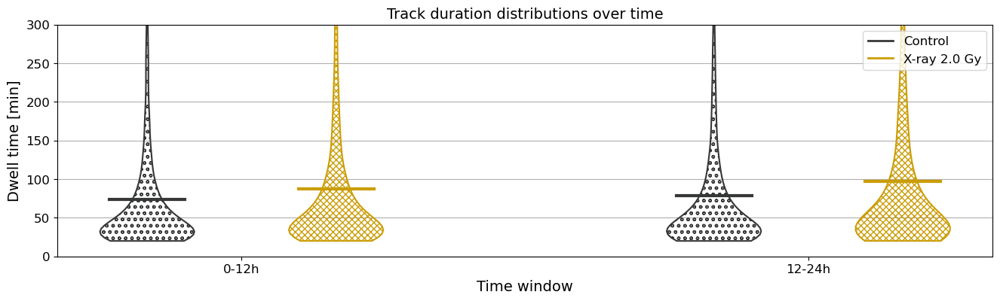

In [18]:
###
# FILL IN THE USER OPTIONS BELOW
###

time_windows = [
    (0, 12*60, "0-12h"),   # define the blocks for which you would like to plot the dwell time separatly
    (12*60, 24*60, "12-24h")
]

###
# END OF USER OPTIONS
###

fig, ax = plt.subplots(figsize=(16,4))
ax.grid(axis='y')
ax.set_axisbelow(True)
plot_violin_time_windows(time_windows, max_bin, plot_samples, ax=ax, mode="max_overlap")
plt.title("Track duration distributions over time")

#plt.savefig(str(data_path / "PLC_PRF_windowed_dwelltime.png"), dpi=600, bbox_inches="tight")  # for saving the figure

### make a plot of the different track filtering modes

found 34568 tracks in 460 nuclei across 12 fields of view
avg active tracks per cell: 7.074688170420121
avg track length in minutes: 75.93624161073825
found 38987 tracks in 367 nuclei across 9 fields of view
avg active tracks per cell: 12.192170818505337
avg track length in minutes: 90.8489496498833
found 34568 tracks in 460 nuclei across 12 fields of view
avg active tracks per cell: 7.074688170420121
avg track length in minutes: 68.40147270689931
found 38987 tracks in 367 nuclei across 9 fields of view
avg active tracks per cell: 12.192170818505337
avg track length in minutes: 80.48289364526298


Text(0.5, 1.0, 'Effect of track filtering within each treatment')

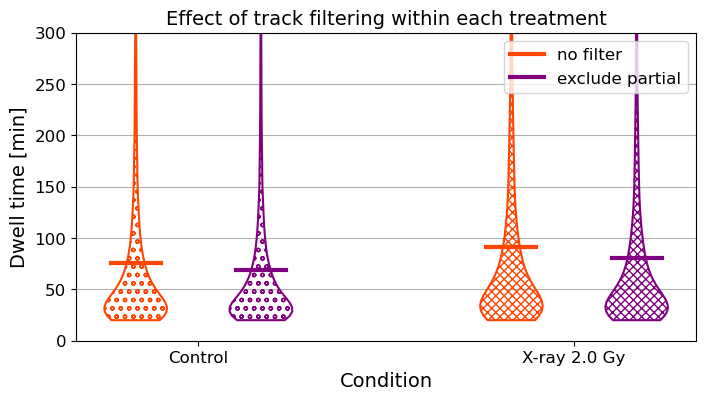

In [14]:
###
# FILL IN THE USER OPTIONS BELOW
###

filter_modes = ["no filter", "exclude partial"]
filter_mode_colors = {
    "no filter": "orangered",              
    "exclude partial": "purple"   
}

filter_plot_samples = [
    {
        "name": "Control",    # name for displaying in the legend of the plots
        "tag": "control",     # identifier tag of one experimental (replicates with same treatment) condition based on how the folder inside the data folder
        "hatch": "oo",       # hatching pattern for the violin plots
    },
    {
        "name": "X-ray 2.0 Gy",
        "tag": "xray",
        "hatch": "xxxx",
    },
]


###
# END OF USER OPTIONS
###

filter_results = {}
for mode in filter_modes:
    samples_for_mode = []
    for sample in filter_plot_samples:

        experiment_paths = list(data_path.glob(f"{sample['tag']}/*/Pos*/results/registered/*"))

        TL, AT, results_dict = extract_tracking_info(experiment_paths, num_of_frames, dt, track_filter=mode)

        samples_for_mode.append({"name": sample["name"], "track_lengths": TL, "hatch": sample["hatch"], })

    filter_results[mode] = samples_for_mode

grouped_filters = [(mode, filter_results[mode]) for mode in filter_modes]

fig, ax = plt.subplots(figsize=(8,4))
ax.grid(axis='y')
ax.set_axisbelow(True)
plot_violin_filter_modes(filter_results, filter_plot_samples, filter_modes, filter_mode_colors, max_bin, ax=ax)
plt.title("Effect of track filtering within each treatment")

#plt.savefig(str(data_path / "track_filter_U2OS.png"), dpi=600, bbox_inches="tight")  # for saving the figure

### make plot of the replicates to see consistency

making plot for: control
found 16099 tracks in 222 nuclei across 4 fields of view
avg active tracks per cell: 7.133521691578563
avg track length in minutes: 77.7876886763153
found 8206 tracks in 90 nuclei across 4 fields of view
avg active tracks per cell: 7.3185015141154635
avg track length in minutes: 73.03875213258591
found 10263 tracks in 148 nuclei across 4 fields of view
avg active tracks per cell: 6.807972673169701
avg track length in minutes: 75.34872844197604
making plot for: xray
found 9143 tracks in 79 nuclei across 3 fields of view
avg active tracks per cell: 13.022894253476778
avg track length in minutes: 86.99464070873893
found 17865 tracks in 139 nuclei across 3 fields of view
avg active tracks per cell: 14.149876220602392
avg track length in minutes: 92.41712846347608
found 11979 tracks in 149 nuclei across 3 fields of view
avg active tracks per cell: 9.721405750798722
avg track length in minutes: 91.45204107187578


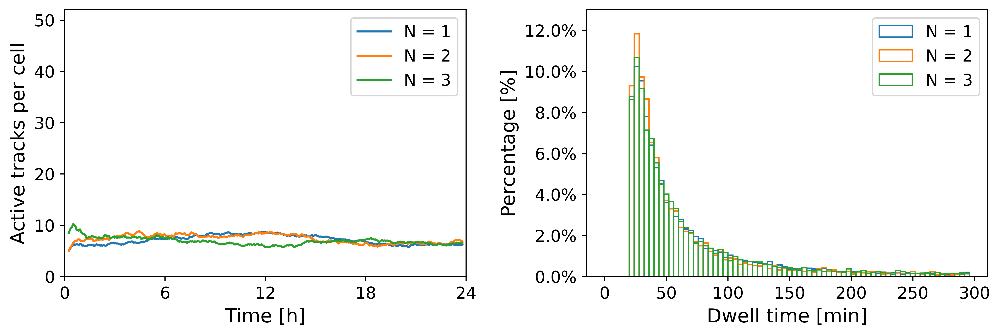

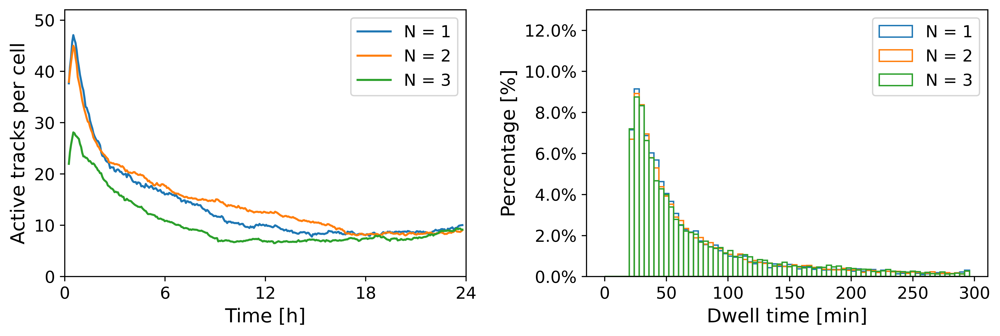

In [20]:
###
# FILL IN THE USER OPTIONS BELOW
###

# identifier tag of one experimental (replicates with same treatment) condition based on how the folder inside the data folder
experiment_tags = ["control", "xray"]

foci_max = 52 # maximum to display on the y-axis of the plot for the number of active tracks

percent_max = 13  # maximum percentage to display for the y axis of the histogram

###
# END OF USER OPTIONS
###

for experiment_tag in experiment_tags:
    print(f"making plot for: {experiment_tag}")
    
    replicates = list(data_path.glob(f"{experiment_tag}/*/"))
    
    fig, ax = plt.subplots(1, 2, figsize=(12,3.5), dpi=600)
    for nn, replicate_path in enumerate(replicates):
        exp_path = list(replicate_path.glob("Pos*/results/registered/*"))
    
        TL, AT, _ =  extract_tracking_info(exp_path, num_of_frames, dt)  

        line, = ax[0].plot(shifted_time[:-remove_final_frames], np.nanmean(AT, 0)[:-remove_final_frames], label=f"N = {nn+1}")
        color = line.get_color()
        
        weights = np.ones_like(TL, dtype=float) / len(TL)
        ax[1].hist(TL, bins=bins, weights=weights, label=f"N = {nn+1}", facecolor="none", edgecolor=color)
        
    ax[0].set_ylabel('Active tracks per cell')
    ax[0].set_ylim([0, foci_max])
    ax[0].set_xlabel('Time [h]')
    ax[0].set_xlim([0, num_of_frames * dt / 60])
    ax[0].set_xticks(np.arange(0, shifted_time.max(), 6))
    ax[0].legend(loc='upper right')
    
    ax[1].set_ylabel("Percentage [%]")
    ax[1].set_ylim([0, percent_max/100])
    ax[1].set_xlabel("Dwell time [min]")
    ax[1].yaxis.set_major_formatter(PercentFormatter(1))
    ax[1].legend(loc='upper right')

    fig.subplots_adjust(wspace=0.3)
    #plt.savefig(str(data_path / f"replicates_{experiment_tag}.png"), dpi=600, bbox_inches="tight")  # for saving the figure

### make a panel with different plots to not have to combine them manually

In [15]:
fig, ax = plt.subplots(4, 1, figsize=(8,16), dpi=1000)

shifted_time = np.arange(num_of_frames) * dt/60 + time_offset/60  
plot_AT(shifted_time, plot_samples, ax=ax[0])
ax[0].set_xlim([0, num_of_frames * dt / 60])  # fix the x limits if needed
ax[0].set_xticks(np.arange(0, shifted_time.max(), 6))  # define the tick marks for the x axis
ax[0].set_ylim([0,foci_max])  # fix the y limits if needed

bins = np.arange(0, max_bin, dt)
plot_hist(bins, plot_samples, log=False, ax=ax[1])
ax[1].set_ylim(0, percent_max/100)

plot_violin(plot_samples, max_bin, ax=ax[2])

ax[3].grid(axis='y')
ax[3].set_axisbelow(True)
plot_violin_filter_modes(filter_results, filter_plot_samples, filter_modes, filter_mode_colors, max_bin, ax=ax[3])

fig.subplots_adjust(hspace=0.3)

plt.savefig(str(data_path / "U2OS_panel.png"), dpi=600, bbox_inches="tight")  # for saving the figure

### perform statistical testing

In [16]:
result_string = run_statistical_tests(plot_samples)
print(result_string)

────────────────────────────────────────────────────────────
  Control  vs  Xray 2.0 Gy
  Number of tracks:  34568  vs  38987
  Mean dwell time:   75.9 min  vs  90.8 min
  Mean difference: +14.9 min
  Permutation test p-value:  0.0003999
  Bootstrap 95 % CI:         [13.34, 16.45] min
  Mann-Whitney U: 738033537,  p-value: 8.418e-111

